<a href="https://colab.research.google.com/github/skhabiri/DS-Unit-2-Kaggle-Challenge/blob/master/module2-random-forests/skhabiri_LS_DS_222_assignment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

*Unit 2, Sprint 2, Module 2*

---

# Random Forests

## Assignment
- [ ] Read [“Adopting a Hypothesis-Driven Workflow”](http://archive.is/Nu3EI), a blog post by a Lambda DS student about the Tanzania Waterpumps challenge.
- [ ] Continue to participate in our Kaggle challenge.
- [ ] Define a function to wrangle train, validate, and test sets in the same way. Clean outliers and engineer features.
- [ ] Try Ordinal Encoding.
- [ ] Try a Random Forest Classifier.
- [ ] Submit your predictions to our Kaggle competition. (Go to our Kaggle InClass competition webpage. Use the blue **Submit Predictions** button to upload your CSV file. Or you can use the Kaggle API to submit your predictions.)
- [ ] Commit your notebook to your fork of the GitHub repo.

## Stretch Goals

### Doing
- [ ] Add your own stretch goal(s) !
- [ ] Do more exploratory data analysis, data cleaning, feature engineering, and feature selection.
- [ ] Try other [categorical encodings](https://contrib.scikit-learn.org/category_encoders/).
- [ ] Get and plot your feature importances.
- [ ] Make visualizations and share on Slack.

### Reading

Top recommendations in _**bold italic:**_

#### Decision Trees
- A Visual Introduction to Machine Learning, [Part 1: A Decision Tree](http://www.r2d3.us/visual-intro-to-machine-learning-part-1/),  and _**[Part 2: Bias and Variance](http://www.r2d3.us/visual-intro-to-machine-learning-part-2/)**_
- [Decision Trees: Advantages & Disadvantages](https://christophm.github.io/interpretable-ml-book/tree.html#advantages-2)
- [How a Russian mathematician constructed a decision tree — by hand — to solve a medical problem](http://fastml.com/how-a-russian-mathematician-constructed-a-decision-tree-by-hand-to-solve-a-medical-problem/)
- [How decision trees work](https://brohrer.github.io/how_decision_trees_work.html)
- [Let’s Write a Decision Tree Classifier from Scratch](https://www.youtube.com/watch?v=LDRbO9a6XPU)

#### Random Forests
- [_An Introduction to Statistical Learning_](http://www-bcf.usc.edu/~gareth/ISL/), Chapter 8: Tree-Based Methods
- [Coloring with Random Forests](http://structuringtheunstructured.blogspot.com/2017/11/coloring-with-random-forests.html)
- _**[Random Forests for Complete Beginners: The definitive guide to Random Forests and Decision Trees](https://victorzhou.com/blog/intro-to-random-forests/)**_

#### Categorical encoding for trees
- [Are categorical variables getting lost in your random forests?](https://roamanalytics.com/2016/10/28/are-categorical-variables-getting-lost-in-your-random-forests/)
- [Beyond One-Hot: An Exploration of Categorical Variables](http://www.willmcginnis.com/2015/11/29/beyond-one-hot-an-exploration-of-categorical-variables/)
- _**[Categorical Features and Encoding in Decision Trees](https://medium.com/data-design/visiting-categorical-features-and-encoding-in-decision-trees-53400fa65931)**_
- _**[Coursera — How to Win a Data Science Competition: Learn from Top Kagglers — Concept of mean encoding](https://www.coursera.org/lecture/competitive-data-science/concept-of-mean-encoding-b5Gxv)**_
- [Mean (likelihood) encodings: a comprehensive study](https://www.kaggle.com/vprokopev/mean-likelihood-encodings-a-comprehensive-study)
- [The Mechanics of Machine Learning, Chapter 6: Categorically Speaking](https://mlbook.explained.ai/catvars.html)

#### Imposter Syndrome
- [Effort Shock and Reward Shock (How The Karate Kid Ruined The Modern World)](http://www.tempobook.com/2014/07/09/effort-shock-and-reward-shock/)
- [How to manage impostor syndrome in data science](https://towardsdatascience.com/how-to-manage-impostor-syndrome-in-data-science-ad814809f068)
- ["I am not a real data scientist"](https://brohrer.github.io/imposter_syndrome.html)
- _**[Imposter Syndrome in Data Science](https://caitlinhudon.com/2018/01/19/imposter-syndrome-in-data-science/)**_


### More Categorical Encodings

**1.** The article **[Categorical Features and Encoding in Decision Trees](https://medium.com/data-design/visiting-categorical-features-and-encoding-in-decision-trees-53400fa65931)** mentions 4 encodings:

- **"Categorical Encoding":** This means using the raw categorical values as-is, not encoded. Scikit-learn doesn't support this, but some tree algorithm implementations do. For example, [Catboost](https://catboost.ai/), or R's [rpart](https://cran.r-project.org/web/packages/rpart/index.html) package.
- **Numeric Encoding:** Synonymous with Label Encoding, or "Ordinal" Encoding with random order. We can use [category_encoders.OrdinalEncoder](https://contrib.scikit-learn.org/category_encoders/ordinal.html).
- **One-Hot Encoding:** We can use [category_encoders.OneHotEncoder](https://contrib.scikit-learn.org/category_encoders/onehot.html).
- **Binary Encoding:** We can use [category_encoders.BinaryEncoder](https://contrib.scikit-learn.org/category_encoders/binary.html).


**2.** The short video 
**[Coursera — How to Win a Data Science Competition: Learn from Top Kagglers — Concept of mean encoding](https://www.coursera.org/lecture/competitive-data-science/concept-of-mean-encoding-b5Gxv)** introduces an interesting idea: use both X _and_ y to encode categoricals.

Category Encoders has multiple implementations of this general concept:

- [CatBoost Encoder](https://contrib.scikit-learn.org/category_encoders/catboost.html)
- [Generalized Linear Mixed Model Encoder](https://contrib.scikit-learn.org/category_encoders/glmm.html)
- [James-Stein Encoder](https://contrib.scikit-learn.org/category_encoders/jamesstein.html)
- [Leave One Out](https://contrib.scikit-learn.org/category_encoders/leaveoneout.html)
- [M-estimate](https://contrib.scikit-learn.org/category_encoders/mestimate.html)
- [Target Encoder](https://contrib.scikit-learn.org/category_encoders/targetencoder.html)
- [Weight of Evidence](https://contrib.scikit-learn.org/category_encoders/woe.html)

Category Encoder's mean encoding implementations work for regression problems or binary classification problems. 

For multi-class classification problems, you will need to temporarily reformulate it as binary classification. For example:

```python
encoder = ce.TargetEncoder(min_samples_leaf=..., smoothing=...) # Both parameters > 1 to avoid overfitting
X_train_encoded = encoder.fit_transform(X_train, y_train=='functional')
X_val_encoded = encoder.transform(X_train, y_val=='functional')
```

For this reason, mean encoding won't work well within pipelines for multi-class classification problems.

**3.** The **[dirty_cat](https://dirty-cat.github.io/stable/)** library has a Target Encoder implementation that works with multi-class classification.

```python
 dirty_cat.TargetEncoder(clf_type='multiclass-clf')
```
It also implements an interesting idea called ["Similarity Encoder" for dirty categories](https://www.slideshare.net/GaelVaroquaux/machine-learning-on-non-curated-data-154905090).

However, it seems like dirty_cat doesn't handle missing values or unknown categories as well as category_encoders does. And you may need to use it with one column at a time, instead of with your whole dataframe.

**4. [Embeddings](https://www.kaggle.com/colinmorris/embedding-layers)** can work well with sparse / high cardinality categoricals.

_**I hope it’s not too frustrating or confusing that there’s not one “canonical” way to encode categoricals. It’s an active area of research and experimentation — maybe you can make your own contributions!**_

### Setup

You can work locally (follow the [local setup instructions](https://lambdaschool.github.io/ds/unit2/local/)) or on Colab (run the code cell below).

In [1]:
%%capture
import sys

# If you're on Colab:
if 'google.colab' in sys.modules:
    DATA_PATH = 'https://github.com/skhabiri/PredictiveModeling-TreeBasedModels-u2s2/tree/master/data/'
    !pip install category_encoders==2.*
    !pip install pandas-profiling==2.*

# If you're working locally:
else:
    DATA_PATH = '../data/'

In [2]:
import pandas as pd
from sklearn.model_selection import train_test_split

train = pd.merge(pd.read_csv(DATA_PATH+'waterpumps/train_features.csv'), 
                 pd.read_csv(DATA_PATH+'waterpumps/train_labels.csv'))
test = pd.read_csv(DATA_PATH+'waterpumps/test_features.csv')
sample_submission = pd.read_csv(DATA_PATH+'waterpumps/sample_submission.csv')

train.shape, test.shape

((59400, 41), (14358, 40))

In [3]:
# Tuning parameters
zero_cols = ["longitude", "latitude", "amount_tsh", "gps_height"]
# zero_cols = [, "longitude", "latitude", "population", "construction_year" ]
# drop_cols=[]"num_private", 
drop_cols = ["waterpoint_type_group", "source_type",
             "quantity_group", "quality_group", "payment_type", "management_group", 
             "extraction_type_group", "recorded_by"]
# In category reduction of each categorical feature {#"others"+offset < sum(#"kept_values")}
offset = 1

# only categorical features with maximum num_card value of cardinality are kept
num_card = 100
# decision tree depth
num_depth =16

In [4]:
# X_train["amount_tsh"].value_counts(dropna=False)

In [5]:
from pandas_profiling import ProfileReport
profile = ProfileReport(train, minimal=True).to_notebook_iframe()

profile

In [6]:
# Split train into train & val
from sklearn.model_selection import train_test_split

train, val = train_test_split(train, train_size=0.80, test_size=0.20, 
                              stratify=train['status_group'], random_state=42)

train.shape, val.shape, test.shape

((47520, 41), (11880, 41), (14358, 40))

In [7]:
# The status_group column is the target
target = 'status_group'

# Get a dataframe with all train columns except the target & id
train_features = train.drop(columns=[target, 'id'])
print(type(train_features), train_features.shape)

# Arrange data into X features matrix and y target vector 
X_train = train[train_features.columns]
y_train = train[target]
X_val = val[train_features.columns]
y_val = val[target]
X_test = test[train_features.columns]
X_train.shape, type(X_train)

<class 'pandas.core.frame.DataFrame'> (47520, 39)


((47520, 39), pandas.core.frame.DataFrame)

In [12]:
def col_check(df, col_name):
  print(df[col_name].describe(),"\n")
  print(f'number of NaNs: {df[col_name].isna().sum()}, percentage:{df[col_name].isna().mean()*100}\n')
    
  print(f'\n{df[col_name].nunique()} unique values')
  print(df[col_name].value_counts(sort=True, ascending=False, dropna=False))

  print(df[col_name].value_counts(sort=True, ascending=False, dropna=False).values[1])

  return

In [13]:
def zero_to_nan(df, col_list):
    """
    any manifestation of dummy zero is converted to np.nan
    """
  zero_list = [0, "0", -2.000000e-08]
  for col in col_list:
    df.loc[df[col].isin(zero_list), col] = np.NaN
  return df

In [14]:
X_train["longitude"].value_counts(dropna=False)

0.000000     1442
39.095684       2
39.092062       2
37.543401       2
39.103752       2
             ... 
32.916174       1
37.662371       1
36.925917       1
37.886589       1
35.445418       1
Name: longitude, Length: 46029, dtype: int64

In [18]:
def compare_cols(df, col1, col2):
  df_ser1 =  pd.DataFrame(df[col1].value_counts(sort=True, ascending=False, dropna=False))
  df_ser2 =  pd.DataFrame(df[col2].value_counts(sort=True, ascending=False, dropna=False))
  return pd.merge(df_ser1, df_ser2, how='outer', left_index=True, right_index=True)[:50]

In [15]:
pd.Dataframe(X_train['basin'].value_counts(sort=True, ascending=False, dropna=False))

Lake Victoria              8137
Pangani                    7173
Rufiji                     6412
Internal                   6255
Lake Tanganyika            5194
Wami / Ruvu                4773
Lake Nyasa                 4075
Ruvuma / Southern Coast    3551
Lake Rukwa                 1950
Name: basin, dtype: int64

In [17]:
pd.DataFrame(X_train['basin'].value_counts(sort=True, ascending=False, dropna=False))

,basin
Lake Victoria,8137
Pangani,7173
Rufiji,6412
Internal,6255
Lake Tanganyika,5194
Wami / Ruvu,4773
Lake Nyasa,4075
Ruvuma / Southern Coast,3551
Lake Rukwa,1950


In [19]:
nonnum_features = X_train.select_dtypes(exclude='number').columns.to_list()
numeric_features = X_train.select_dtypes(include='number').columns.to_list()

In [20]:
numeric_features

['amount_tsh',
 'gps_height',
 'longitude',
 'latitude',
 'num_private',
 'region_code',
 'district_code',
 'population',
 'construction_year']

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

In [32]:
stats.pearsonr(X_train['region_code'], X_train['district_code'])[0]

0.68188249037746

/Users/shahnam/.pyenv/versions/3.7.8/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


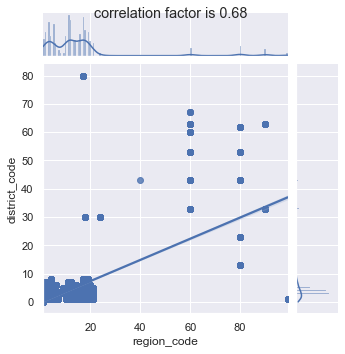

In [35]:
def plot_join_plot(df, feature, target):
    sns.set(style="darkgrid", color_codes=True)
    ax = sns.jointplot(feature, target, data = df, kind ='reg', height=5)
    ax.fig.suptitle(
        f"correlation factor is {stats.pearsonr(df[feature], df[target])[0]:0.2f}")
    return

plot_join_plot(X_train, 'region_code', 'district_code')

plt.show()

In [36]:
nonnum_features

['date_recorded',
 'funder',
 'installer',
 'wpt_name',
 'basin',
 'subvillage',
 'region',
 'lga',
 'ward',
 'public_meeting',
 'recorded_by',
 'scheme_management',
 'scheme_name',
 'permit',
 'extraction_type',
 'extraction_type_group',
 'extraction_type_class',
 'management',
 'management_group',
 'payment',
 'payment_type',
 'water_quality',
 'quality_group',
 'quantity',
 'quantity_group',
 'source',
 'source_type',
 'source_class',
 'waterpoint_type',
 'waterpoint_type_group']

In [51]:
(X_train.sort_values(by=['payment_type'], axis=0))[["payment_type", "payment"]].sample(5)

,payment_type,payment
5042,on failure,pay when scheme fails
24639,annually,pay annually
27186,never pay,never pay
8874,never pay,never pay
18780,never pay,never pay


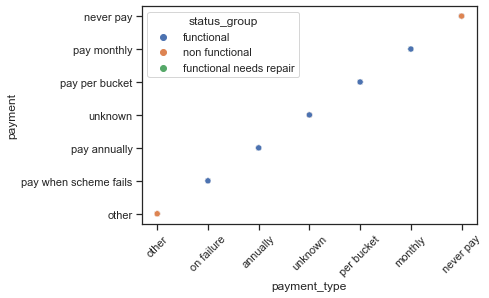

In [53]:
# Redundancy in data
sns.set(style="ticks")
g = sns.scatterplot(x="payment_type", y="payment", hue="status_group", data=train)
plt.xticks(rotation=45)
g.invert_xaxis()
plt.show()

In [54]:
#Skewed to zero
X_train["recorded_by"].describe()

count                       47520
unique                          1
top       GeoData Consultants Ltd
freq                        47520
Name: recorded_by, dtype: object

In [55]:
col_check(X_train,"permit")

count     45077
unique        2
top        True
freq      31071
Name: permit, dtype: object 

number of NaNs: 2443, percentage:5.1409932659932664


2 unique values
True     31071
False    14006
NaN       2443
Name: permit, dtype: int64
14006


* convert "date_recorded" and "construction_year" to datetime format
* columns to drop:
 - * "amount_tsh", "num_private" mostly 0
 - "region" and "district_code" duplicate of "region_code"
 - "public_meeting" skewed and not really related
 - *"recorded_by" single value
 - "extraction_type_class", and "extraction_type_group" duplicate "extraction_type"
 - "management_group" is duplicate
 - *"payment_type" is the same as "payment"
 - "quality_group" is similar to "water_quality"
 - *quantity_group"is the same as "quantity"
 - "source_type" overlaps with "source"
 - "waterpoint_type_group" overlaps with "waterpoint_type"

In [56]:
# zero_cols = ["amount_tsh", "gps_height", "longitude", "latitude", "population", "construction_year" ]
# drop_cols = ["num_private", "waterpoint_type_group", "source_type", "quantity_group", "quality_group", "payment_type", "management_group", "extraction_type_group", "recorded_by"]

In [57]:
import numpy as np

In [58]:
def wrangle2(df, zero_cols, drop_cols):
  df["date_recorded"] = pd.to_datetime(df["date_recorded"], infer_datetime_format=True).dt.year
  df = zero_to_nan(df, zero_cols)
  df = df.drop(drop_cols, axis=1)
  return df

In [59]:
X_train = wrangle2(X_train, zero_cols, drop_cols)
X_val = wrangle2(X_val, zero_cols, drop_cols)
X_test = wrangle2(X_test, zero_cols, drop_cols)

/Users/shahnam/.pyenv/versions/3.7.8/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/Users/shahnam/.pyenv/versions/3.7.8/lib/python3.7/site-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)


In [60]:
X_train.columns

Index(['amount_tsh', 'date_recorded', 'funder', 'gps_height', 'installer',
       'longitude', 'latitude', 'wpt_name', 'num_private', 'basin',
       'subvillage', 'region', 'region_code', 'district_code', 'lga', 'ward',
       'population', 'public_meeting', 'scheme_management', 'scheme_name',
       'permit', 'construction_year', 'extraction_type',
       'extraction_type_class', 'management', 'payment', 'water_quality',
       'quantity', 'source', 'source_class', 'waterpoint_type'],
      dtype='object')

In [61]:
X_train["date_recorded"][:10]

43360    2011
7263     2011
2486     2011
313      2011
52726    2011
8558     2011
2559     2013
54735    2011
25763    2011
44540    2011
Name: date_recorded, dtype: int64

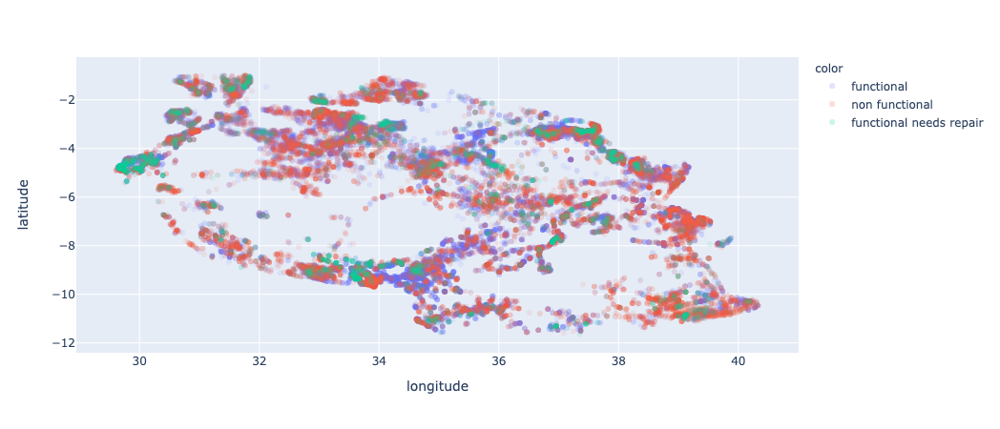

In [62]:
import plotly.express as px
px.scatter(X_train, x='longitude', y='latitude', color=train['status_group'], opacity=0.1)

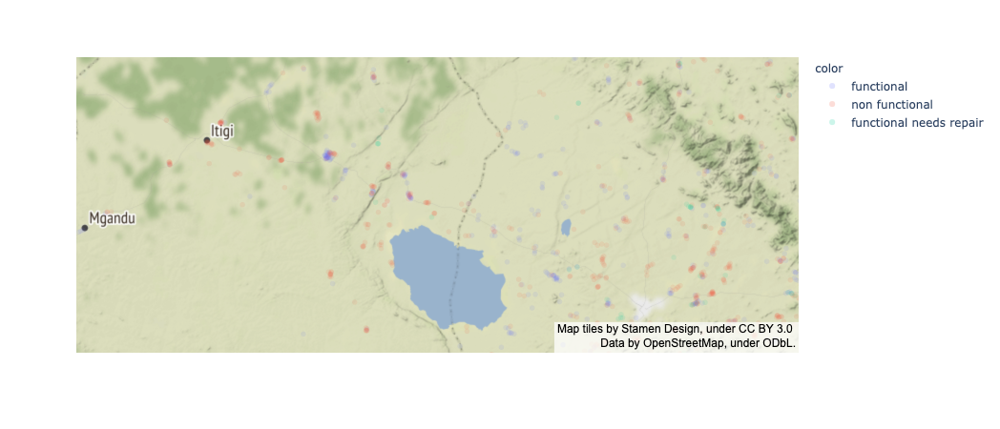

In [63]:
# https://plot.ly/python/mapbox-layers/#base-maps-in-layoutmapboxstyle
fig = px.scatter_mapbox(X_train, lat='latitude', lon='longitude', color=train['status_group'], opacity=0.1)
fig.update_layout(mapbox_style='stamen-terrain')
fig.show()

In [64]:
nonnum_features = X_train.select_dtypes(exclude='number').columns.to_list()
numeric_features = X_train.select_dtypes(include='number').columns.to_list()

In [65]:
# reduces number of the categories
def cat_comb(train, testval_list, col_list, offset):
  '''
  ex/ cat_comb(train, [validation, test] [col1, col2])
  '''
  df = train.copy()
  test_list = testval_list.copy()
  for col_name in col_list:
    cat_ser = df[col_name].value_counts(sort=True, ascending=False, dropna=False)
    # make sure "other" category value is less than sum of predecessors
    for i in range(len(cat_ser)):
      if cat_ser[:i+1].sum() < (cat_ser[i+1:].sum() + offset):
        continue
      else:
        n_cat = i+1
        break
  
    cat_keep = list(cat_ser[:n_cat].index)
    df.loc[~df[col_name].isin(cat_keep), col_name] = "other"
    
    # alternative, very slow .replace method
    # mask = ~df[col_name].isin(cat_keep)
    # df[col_name] = df[col_name].replace(mask, "other")


    for df_i in test_list:
      df_i.loc[~df_i[col_name].isin(cat_keep), col_name] = "other"
  
    # alternative way, but could get a size issue with test or validation data
    # cat_bool = ~(df[col_name].isin(cat_ser.index[:n_cat]))
    # df.loc[cat_bool, col_name] = "other"
  return df, test_list


In [66]:
X_val.shape, X_test.shape, X_train.shape

((11880, 31), (14358, 31), (47520, 31))

In [67]:
X_train, X_test_list = cat_comb(X_train, [X_val, X_test], nonnum_features, offset)
X_val = X_test_list[0]
X_test = X_test_list[1]

In [68]:
def make_feat(train_df, num_card):
  # Get a list of the numeric features
  numeric_features = train_df.select_dtypes(include='number').columns.to_list()

  nonnum_features = train_df.columns[~train_df.columns.isin(numeric_features)].to_list()
  # nonnum_features = train_df.select_dtypes(exclude='number').columns

  assert len(numeric_features) + len(nonnum_features) == len(train_df.columns)

  # Get a series with the cardinality of the nonnumeric features
  cardinality = train_df.select_dtypes(exclude='number').nunique()
  print(cardinality.sort_values())
  # Get a list of all categorical features with cardinality <= num_cat
  categorical_features = cardinality[cardinality <= num_card].index.to_list()
  # Combine the lists 
  features = numeric_features + categorical_features
  return features, numeric_features, categorical_features

In [69]:
features, numeric_features, categorical_features = make_feat(X_train, num_card);

quantity                    2
water_quality               2
management                  2
public_meeting              2
scheme_management           2
source_class                2
permit                      2
waterpoint_type             3
source                      3
payment                     3
extraction_type_class       3
extraction_type             3
scheme_name                 4
basin                       5
region                      8
installer                  11
funder                     16
lga                        34
ward                      415
subvillage               2358
wpt_name                 6903
dtype: int64


In [70]:
# Arrange data into X features matrix and y target vector 
X_train = X_train[features]
X_val = X_val[features]
X_test = X_test[features]

In [71]:
X_val.shape, X_test.shape, X_train.shape

((11880, 28), (14358, 28), (47520, 28))

In [72]:
import category_encoders as ce
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

In [79]:
pipe_model = make_pipeline(
    # if cols not specified it encodes all categorical ones
    ce.OneHotEncoder(use_cat_names=True, cols=categorical_features),
    SimpleImputer(),
    StandardScaler(),
    LogisticRegression(n_jobs=-1)
)

# Fit
pipe_model.fit(X_train, y_train)

/Users/shahnam/.pyenv/versions/3.7.8/lib/python3.7/site-packages/category_encoders/utils.py:21: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



Pipeline(steps=[('onehotencoder',
                 OneHotEncoder(cols=['funder', 'installer', 'basin', 'region',
                                     'lga', 'public_meeting',
                                     'scheme_management', 'scheme_name',
                                     'permit', 'extraction_type',
                                     'extraction_type_class', 'management',
                                     'payment', 'water_quality', 'quantity',
                                     'source', 'source_class',
                                     'waterpoint_type'],
                               use_cat_names=True)),
                ('simpleimputer', SimpleImputer()),
                ('standardscaler', StandardScaler()),
                ('logisticregression', LogisticRegression(n_jobs=-1))])

In [80]:
# Metrics
print('Training Accuracy', pipe_model.score(X_train, y_train))
print('Validation Accuracy', pipe_model.score(X_val, y_val))

Training Accuracy 0.6932659932659933
Validation Accuracy 0.6912457912457912


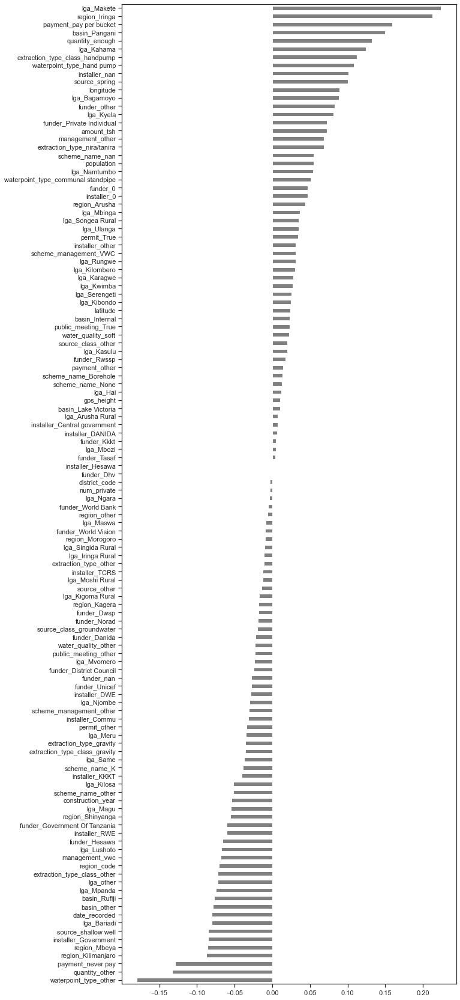

In [81]:
%matplotlib inline
import matplotlib.pyplot as plt

model = pipe_model.named_steps['logisticregression']
encoder = pipe_model.named_steps['onehotencoder']
encoded_columns = encoder.transform(X_val).columns
coefficients = pd.Series(model.coef_[0], encoded_columns)
plt.figure(figsize=(10,30))
coefficients.sort_values().plot.barh(color='grey');

In [82]:
encoded_columns.shape

(120,)

In [83]:
coefficients[:10]

amount_tsh           0.072545
date_recorded       -0.080019
gps_height           0.010349
longitude            0.088889
latitude             0.023718
num_private         -0.002887
region_code         -0.070743
district_code       -0.002859
population           0.054723
construction_year   -0.054132
dtype: float64

## Decision Tree

In [84]:
from sklearn.tree import DecisionTreeClassifier

In [85]:
dt_model = make_pipeline(
    ce.OneHotEncoder(use_cat_names=True),
    SimpleImputer(),
    DecisionTreeClassifier(random_state=42, max_depth=num_depth)
)

dt_model.fit(X_train, y_train);

/Users/shahnam/.pyenv/versions/3.7.8/lib/python3.7/site-packages/category_encoders/utils.py:21: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



In [86]:
# Metrics
print('Training Accuracy', dt_model.score(X_train, y_train))
print('Validation Accuracy', dt_model.score(X_val, y_val))

Training Accuracy 0.8726430976430977
Validation Accuracy 0.7513468013468013


In [87]:
pred1 = dt_model.predict(X_test)
pred1

array(['functional', 'functional', 'functional', ..., 'functional',
       'functional', 'non functional'], dtype=object)

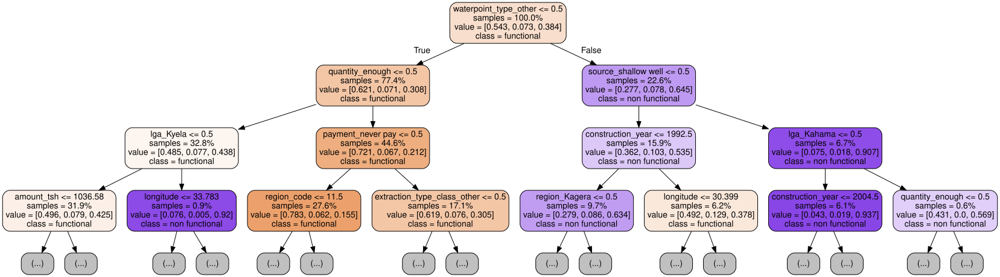

In [88]:
## Plot tree
## https://scikit-learn.org/stable/modules/generated/sklearn.tree.export_graphviz.html

import graphviz
from sklearn.tree import export_graphviz

model = dt_model.named_steps['decisiontreeclassifier']
encoder = dt_model.named_steps['onehotencoder']
encoded_columns = encoder.transform(X_val).columns

dot_data = export_graphviz(model, 
                           out_file=None, 
                           max_depth=3, 
                           feature_names=encoded_columns,
                           class_names=model.classes_, 
                           impurity=False, 
                           filled=True, 
                           proportion=True, 
                           rounded=True)   
display(graphviz.Source(dot_data))

* Ordinal encoder

In [89]:
encoder = ce.OrdinalEncoder()
encoded = encoder.fit_transform(X_train)
print(f'1 column, {encoded.nunique()} unique values')
encoded.head(20)

1 column, amount_tsh                  93
date_recorded                5
gps_height                2400
longitude                46028
latitude                 46026
num_private                 59
region_code                 27
district_code               20
population                 986
construction_year           55
funder                      17
installer                   12
basin                        5
region                       8
lga                         34
public_meeting               2
scheme_management            2
scheme_name                  5
permit                       2
extraction_type              3
extraction_type_class        3
management                   2
payment                      3
water_quality                2
quantity                     2
source                       3
source_class                 2
waterpoint_type              3
dtype: int64 unique values


,amount_tsh,date_recorded,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year,...,permit,extraction_type,extraction_type_class,management,payment,water_quality,quantity,source,source_class,waterpoint_type
43360,NaN,2011,NaN,33.542898,-9.174777,0,12,4,0,0,...,1,1,1,1,1,1,1,1,1,1
7263,500.0,2011,2049.0,34.665760,-9.308548,0,11,4,175,2008,...,2,1,1,2,2,1,2,1,1,1
2486,25.0,2011,290.0,38.238568,-6.179919,0,6,1,2300,2010,...,1,2,2,1,3,2,1,2,1,2
313,NaN,2011,NaN,30.716727,-1.289055,0,18,1,0,0,...,2,2,3,1,1,1,2,2,1,3
52726,NaN,2011,NaN,35.389331,-6.399942,0,1,6,0,0,...,2,2,3,1,3,1,2,3,1,1
8558,NaN,2011,1295.0,31.214583,-8.431428,0,15,2,200,1986,...,2,1,1,1,1,1,1,3,2,1
2559,20000.0,2013,1515.0,36.696700,-3.337926,0,2,2,150,1995,...,2,1,1,1,2,1,1,1,1,3
54735,NaN,2011,NaN,36.292724,-5.177333,0,1,1,0,0,...,1,2,3,1,3,1,2,3,1,1
25763,NaN,2011,NaN,32.877248,-8.925921,0,12,6,0,0,...,1,2,2,1,1,1,2,3,1,2
44540,NaN,2011,NaN,33.014412,-3.115869,0,19,7,0,0,...,2,2,3,1,2,1,2,3,1,3


#### Ordinal Encoding, Decision Tree, Validation Accuracy


In [90]:
dt = make_pipeline(
    ce.OrdinalEncoder(), 
    SimpleImputer(), 
    DecisionTreeClassifier(random_state=42, max_depth=num_depth)
)

dt.fit(X_train, y_train)
score = dt.score(X_val, y_val)
print('Decision Tree, Validation Accuracy', score)

Decision Tree, Validation Accuracy 0.7546296296296297


### Tree ensembles , random forest

In [91]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectKBest
from category_encoders import OneHotEncoder, OrdinalEncoder
from sklearn.impute import SimpleImputer

In [92]:
%%time
model = Pipeline([
                  ('ohe', OneHotEncoder()),
                  ('impute', SimpleImputer()),
                  ('select', SelectKBest(k=15)),
                  ('classifier', DecisionTreeClassifier())
])

model.fit(X_train, y_train)

print('training accuracy:', model.score(X_train, y_train))
print('validation accuracy:', model.score(X_val, y_val))

/Users/shahnam/.pyenv/versions/3.7.8/lib/python3.7/site-packages/category_encoders/utils.py:21: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



training accuracy: 0.6727483164983165
validation accuracy: 0.6680134680134681
CPU times: user 3.49 s, sys: 2.25 s, total: 5.74 s
Wall time: 5.76 s


In [93]:
%%time
model = Pipeline([
                  ('ohe', OneHotEncoder()),
                  ('impute', SimpleImputer()),
                  # ('select', SelectKBest(k=15)),
                  ('classifier', RandomForestClassifier(n_jobs=-1, max_depth=num_depth))
])

model.fit(X_train, y_train)

print('training accuracy:', model.score(X_train, y_train))
print('validation accuracy:', model.score(X_val, y_val))

/Users/shahnam/.pyenv/versions/3.7.8/lib/python3.7/site-packages/category_encoders/utils.py:21: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



training accuracy: 0.8816919191919191
validation accuracy: 0.7855218855218855
CPU times: user 15.1 s, sys: 2.49 s, total: 17.6 s
Wall time: 7.93 s


In [94]:
%%time
model = Pipeline([
                  ('ord', OrdinalEncoder()),
                  ('impute', SimpleImputer()),
                  # ('select', SelectKBest(k=15)),
                  ('classifier', RandomForestClassifier(n_jobs=-1, max_depth=num_depth))
])

model.fit(X_train, y_train)

print('training accuracy:', model.score(X_train, y_train))
print('validation accuracy:', model.score(X_val, y_val))

training accuracy: 0.9095117845117845
validation accuracy: 0.7897306397306397
CPU times: user 9.96 s, sys: 250 ms, total: 10.2 s
Wall time: 2.31 s


In [95]:
pred1 = model.predict(X_test)
pred1

array(['non functional', 'functional', 'functional', ..., 'functional',
       'non functional', 'non functional'], dtype=object)

In [96]:
submission_3 = sample_submission.copy()
submission_3["status_group"] = pred1
submission_3.nunique()

id              14358
status_group        3
dtype: int64

In [97]:
submission_3.to_csv("submission_3.csv", index=False)

In [98]:
X_train.columns

Index(['amount_tsh', 'date_recorded', 'gps_height', 'longitude', 'latitude',
       'num_private', 'region_code', 'district_code', 'population',
       'construction_year', 'funder', 'installer', 'basin', 'region', 'lga',
       'public_meeting', 'scheme_management', 'scheme_name', 'permit',
       'extraction_type', 'extraction_type_class', 'management', 'payment',
       'water_quality', 'quantity', 'source', 'source_class',
       'waterpoint_type'],
      dtype='object')